# Module 10 — Trajectory & Pseudotime Analysis (v4)

This notebook visualizes pre-computed trajectory and pseudotime results from
`scripts/10_trajectory.py`. PAGA (Partition-based Graph Abstraction) is used
to infer cell state transitions, and diffusion pseudotime (DPT) orders cells
along differentiation/degeneration trajectories.

**Pipeline version:** v4 (scANVI-based, 12 modules)

**Data sources:**
- `results/trajectories/paga_*.png` — PAGA connectivity graphs
- `results/trajectories/umap_trajectory_*.png` — UMAP with pseudotime overlay
- `results/trajectories/pseudotime_by_condition_*.png` — Pseudotime distributions
- `results/trajectories/pseudotime_by_celltype_*.png` — Cell type ordering
- `results/trajectories/gene_dynamics_*.png` — Gene expression over pseudotime
- `results/trajectories/pseudotime_correlations_*.tsv` — Statistical tests
- `results/trajectories/trajectory_genes_*.tsv` — Genes correlated with pseudotime
- `results/trajectories/trajectory_de_overlap_*.tsv` — Overlap with Module 08 DE genes

In [1]:
import warnings
warnings.filterwarnings('ignore', category=FutureWarning)
warnings.filterwarnings('ignore', category=UserWarning)

from pathlib import Path

import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import Image, display, Markdown

plt.rcParams.update({'figure.dpi': 120, 'savefig.dpi': 200, 'savefig.bbox': 'tight'})

# ── Paths ──────────────────────────────────────────────────────────────────
BASE = Path('..').resolve()
RESULTS = BASE / 'results' / 'trajectories'

print(f'Results directory: {RESULTS}')
print(f'PNG files: {len(list(RESULTS.glob("*.png")))}')
print(f'TSV files: {len(list(RESULTS.glob("*.tsv")))}')

Results directory: /home/ubuntu/lotz-ivd/results/trajectories
PNG files: 15
TSV files: 12


## Pseudotime-Condition Correlations

Spearman correlation between pseudotime and condition (encoded as ordinal:
healthy < mild < severe). A negative correlation means degenerated cells
occupy earlier pseudotime positions; a positive correlation means degenerated
cells are at later positions.

In [2]:
# Load and display correlation results for each compartment
compartments = ['NP', 'AF', 'CEP']

all_corrs = []
for comp in compartments:
    corr_path = RESULTS / f'pseudotime_correlations_{comp}.tsv'
    if corr_path.exists():
        df = pd.read_csv(corr_path, sep='\t')
        if 'compartment' not in df.columns:
            df.insert(0, 'compartment', comp)
        else:
            df['compartment'] = comp
        all_corrs.append(df)

if all_corrs:
    corr_df = pd.concat(all_corrs, ignore_index=True)
    display(corr_df.style.set_caption('Pseudotime-Condition Correlations by Compartment'))
else:
    print('No correlation files found')

,compartment,embedding,test,rho,pvalue,n,statistic,n_healthy,n_degen,median_healthy,median_degen
0,NP,scVI_mesenchymal,pseudotime_vs_condition_ordinal,-0.092276,0.000000,50000.000000,nan,nan,nan,nan,nan
1,NP,scVI_mesenchymal,pseudotime_healthy_vs_degenerated,nan,0.000000,nan,196089248.000000,14617.000000,29917.000000,0.184376,0.184487
2,NP,scVI_mesenchymal,pseudotime_vs_condition_NP_mature_chondrocyte,-0.544736,0.000000,16133.000000,nan,nan,nan,nan,nan
3,NP,scVI_mesenchymal,pseudotime_vs_condition_NP_fibrocartilaginous,-0.024708,0.000027,28890.000000,nan,nan,nan,nan,nan
4,NP,scVI_mesenchymal,pseudotime_vs_condition_NP_stressed,0.269309,0.000000,1209.000000,nan,nan,nan,nan,nan
5,NP,scVI_mesenchymal,pseudotime_vs_condition_NP_notochordal,0.096058,0.047813,425.000000,nan,nan,nan,nan,nan
6,NP,scVI_mesenchymal,pseudotime_vs_condition_Fibrochondrocyte_chondroid,0.058348,0.004743,2341.000000,nan,nan,nan,nan,nan
7,NP,scVI_mesenchymal,pseudotime_vs_condition_Fibrochondrocyte_stressed,0.190249,0.000267,363.000000,nan,nan,nan,nan,nan
8,NP,scVI_mesenchymal,pseudotime_vs_condition_unassigned,-0.162384,0.026389,187.000000,nan,nan,nan,nan,nan
9,NP,scVI_mesenchymal,pseudotime_vs_condition_Fibrochondrocyte_fibroid,-0.647061,0.000000,452.000000,nan,nan,nan,nan,nan


## PAGA Connectivity Graphs

PAGA shows the connectivity between cell type clusters in the trajectory graph.
Edge thickness represents the strength of connection, revealing which cell
states are transcriptionally adjacent.

### NP — PAGA Graph

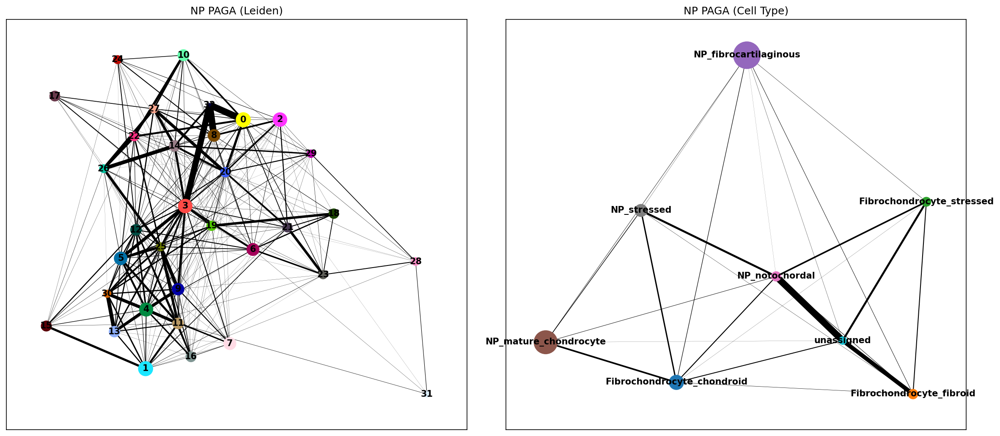

### AF — PAGA Graph

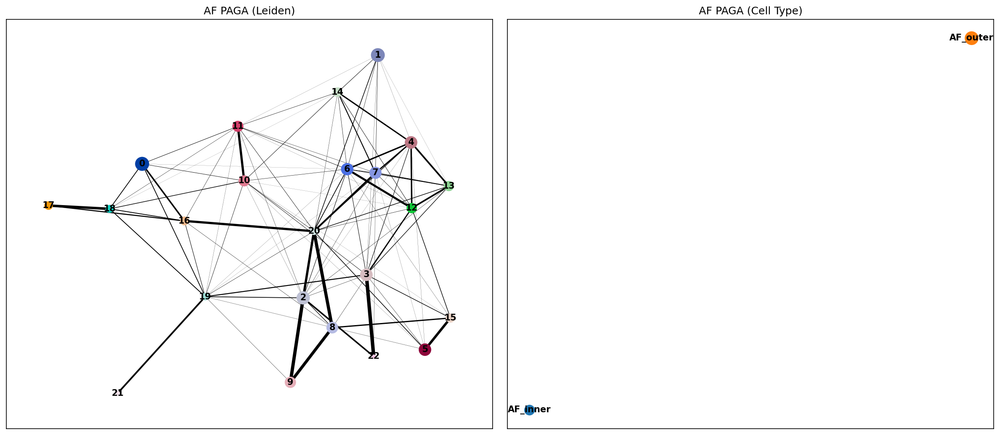

### CEP — PAGA Graph

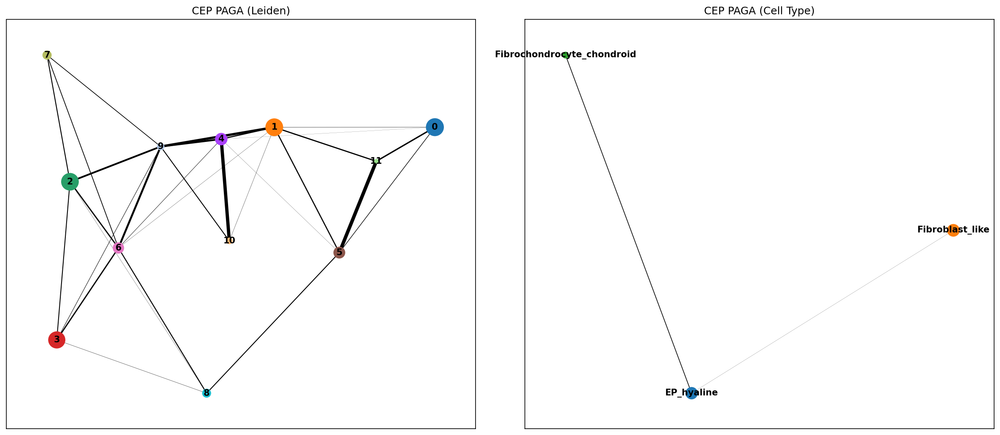

In [3]:
for comp in compartments:
    paga_path = RESULTS / f'paga_{comp}.png'
    if paga_path.exists():
        display(Markdown(f'### {comp} — PAGA Graph'))
        display(Image(filename=str(paga_path), width=700))
    else:
        print(f'PAGA plot not found for {comp}')

## Pseudotime by Condition

Distribution of pseudotime values for each condition (healthy, mild degeneration,
severe degeneration). Shifts in the distribution indicate trajectory position
changes with disease.

### NP — Pseudotime by Condition

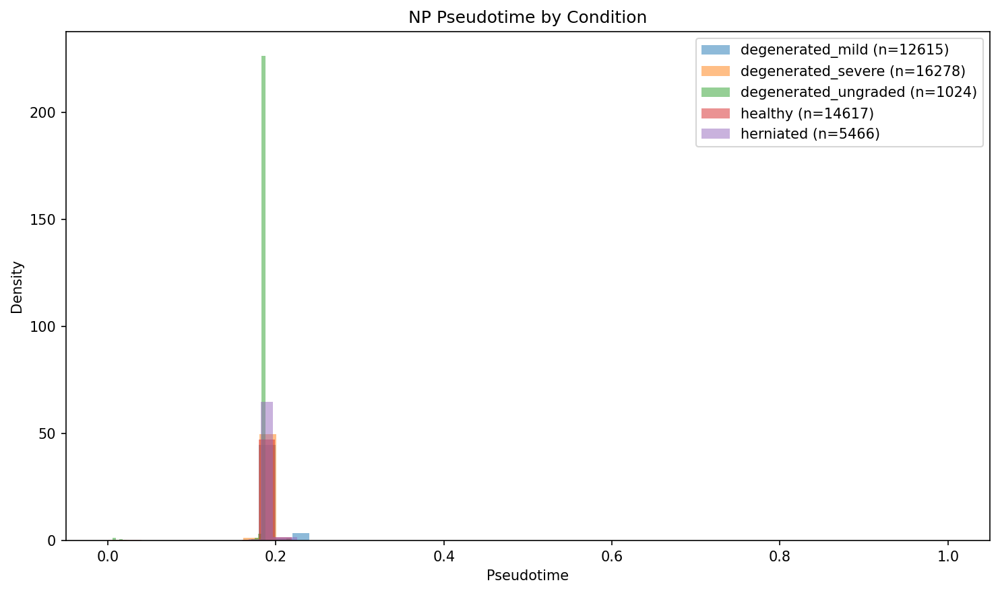

### AF — Pseudotime by Condition

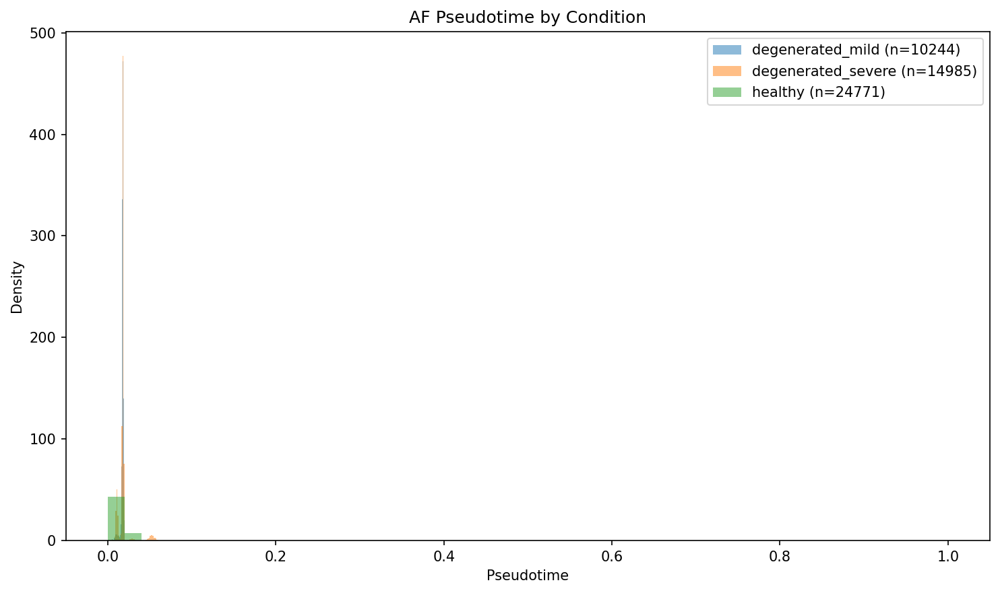

### CEP — Pseudotime by Condition

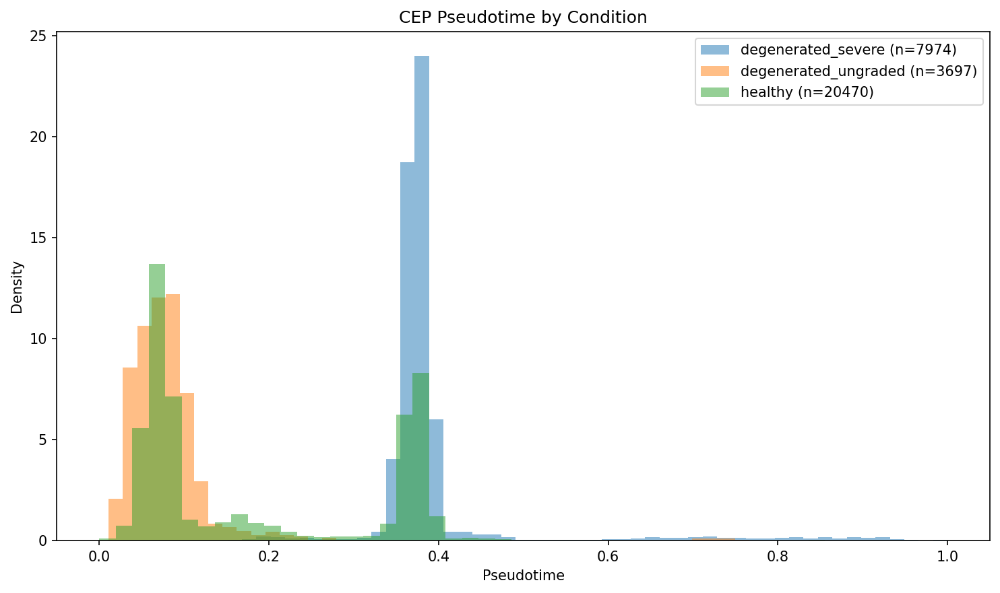

In [4]:
for comp in compartments:
    pt_cond_path = RESULTS / f'pseudotime_by_condition_{comp}.png'
    if pt_cond_path.exists():
        display(Markdown(f'### {comp} — Pseudotime by Condition'))
        display(Image(filename=str(pt_cond_path), width=700))
    else:
        print(f'Pseudotime by condition plot not found for {comp}')

## Pseudotime by Cell Type

Pseudotime ordering across cell types within each compartment. This reveals
the progression from one cell state to another along the trajectory.

### NP — Pseudotime by Cell Type

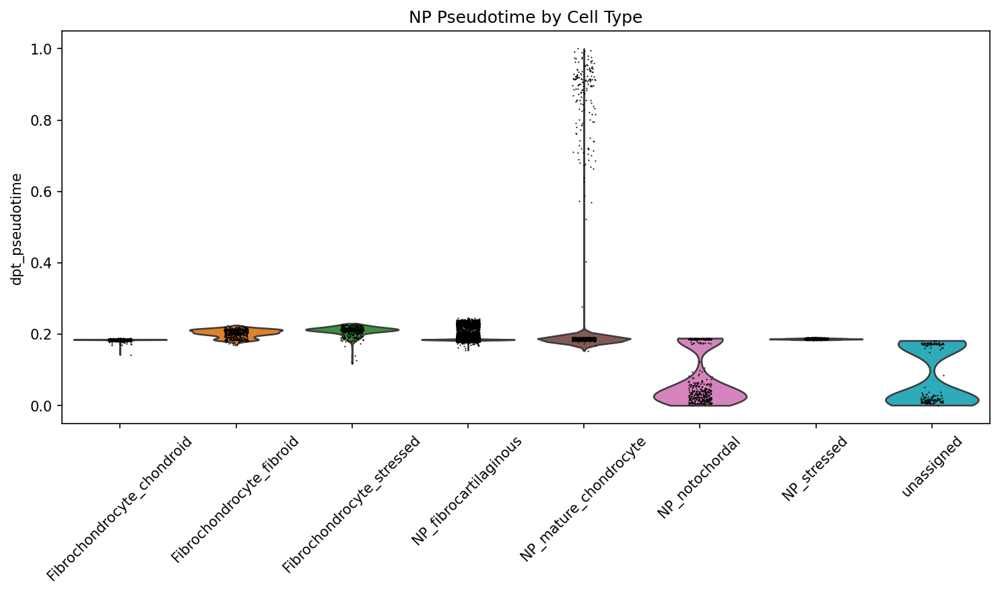

### AF — Pseudotime by Cell Type

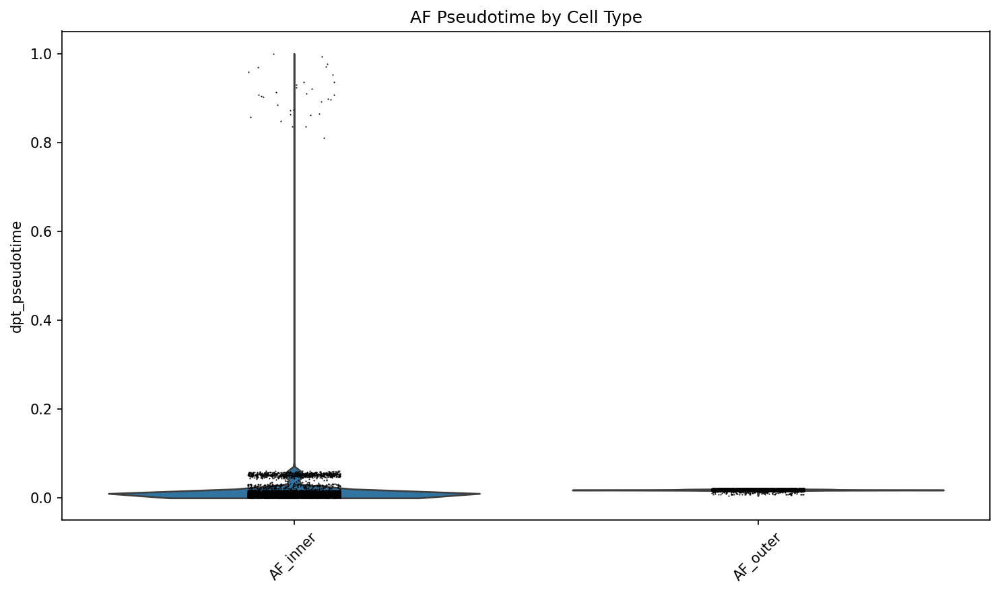

### CEP — Pseudotime by Cell Type

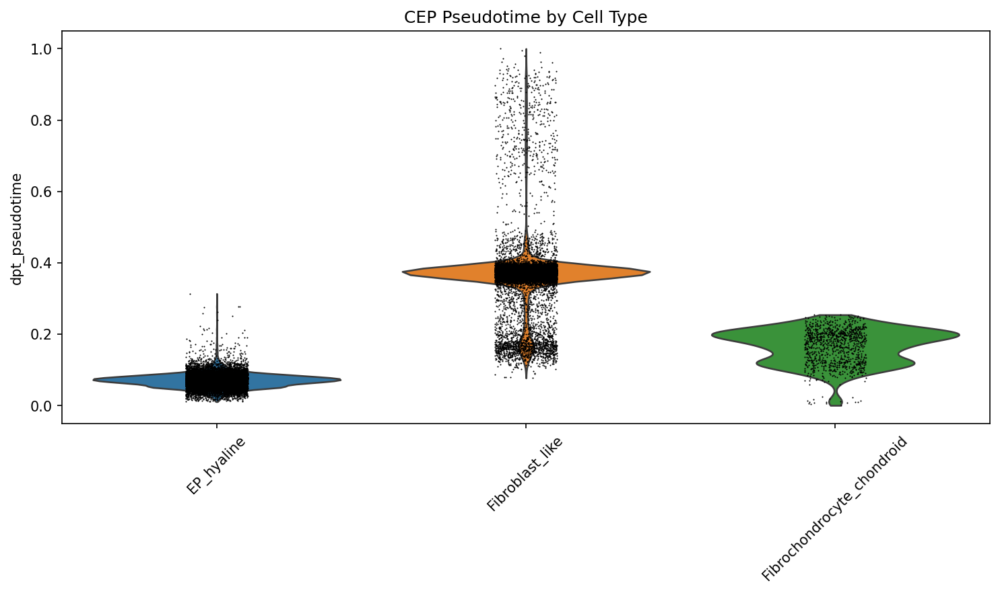

In [5]:
for comp in compartments:
    pt_ct_path = RESULTS / f'pseudotime_by_celltype_{comp}.png'
    if pt_ct_path.exists():
        display(Markdown(f'### {comp} — Pseudotime by Cell Type'))
        display(Image(filename=str(pt_ct_path), width=700))
    else:
        print(f'Pseudotime by cell type plot not found for {comp}')

## Gene Dynamics Along Pseudotime

Expression of key genes plotted as a function of pseudotime. These show how
marker gene expression changes along the trajectory, highlighting the genes
that drive cell state transitions.

### NP — Gene Dynamics

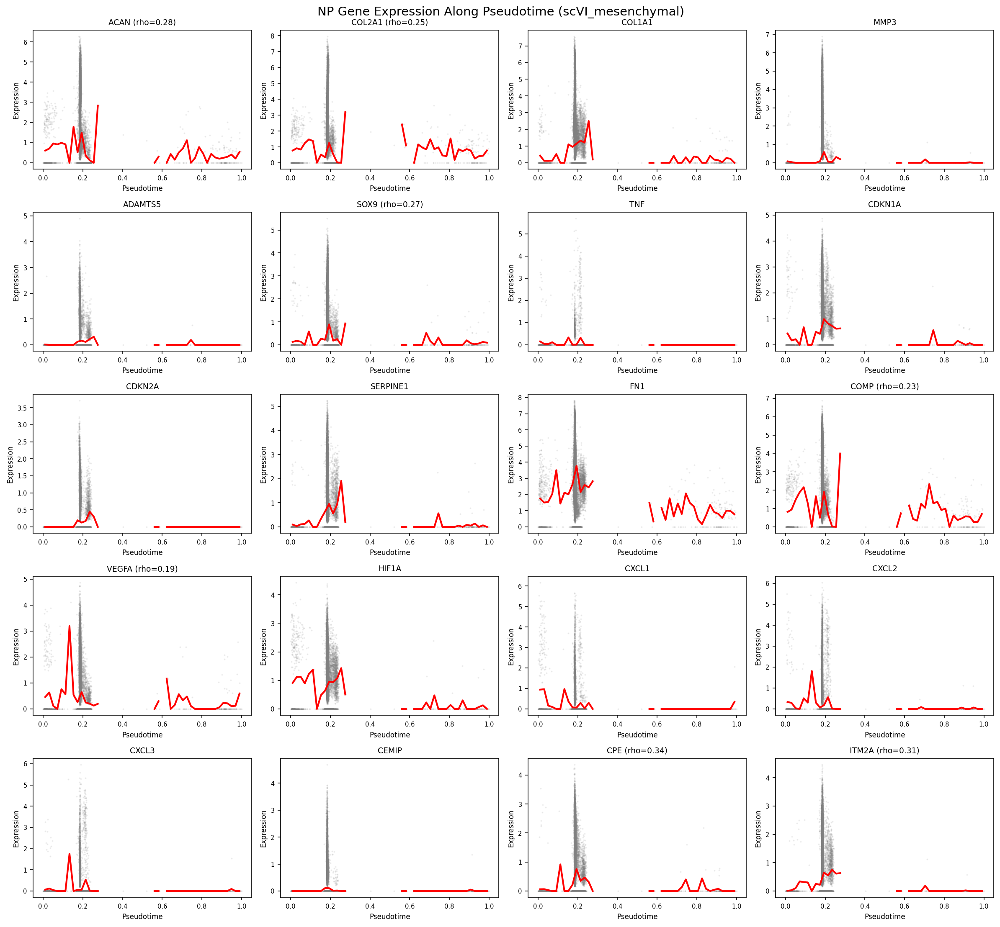

### AF — Gene Dynamics

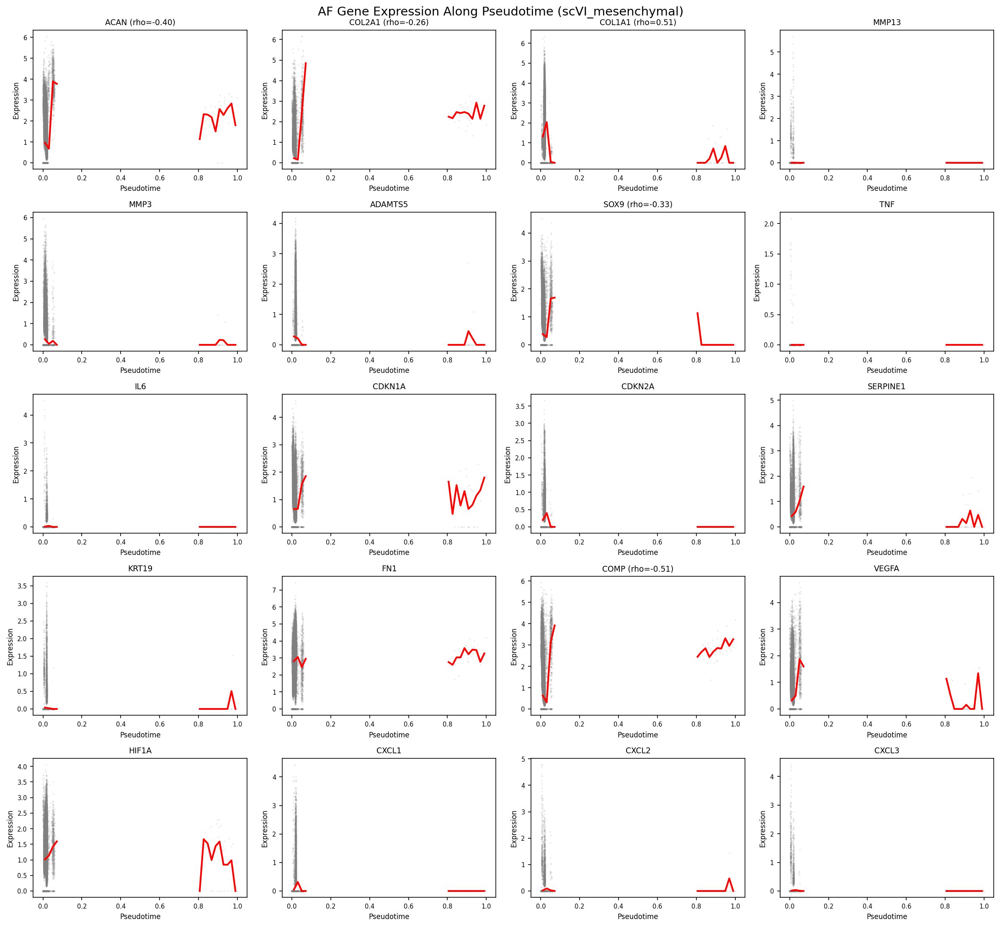

### CEP — Gene Dynamics

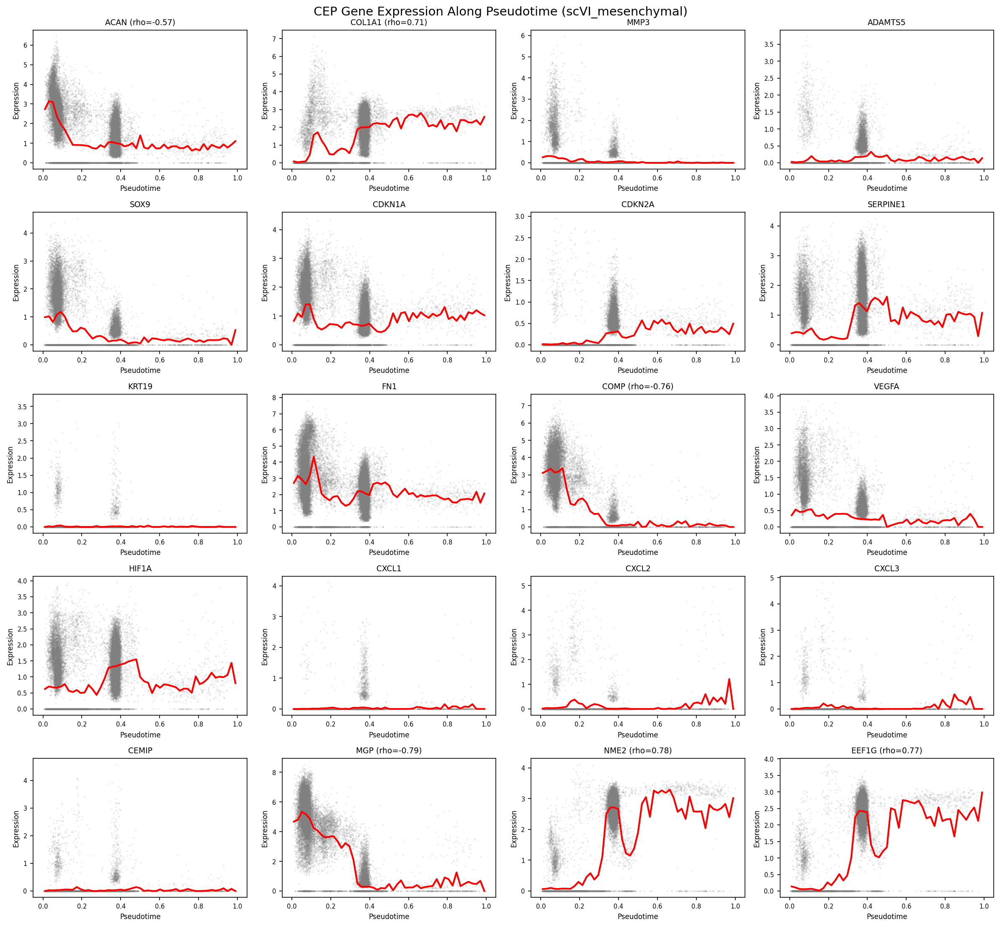

In [6]:
for comp in compartments:
    gene_path = RESULTS / f'gene_dynamics_{comp}.png'
    if gene_path.exists():
        display(Markdown(f'### {comp} — Gene Dynamics'))
        display(Image(filename=str(gene_path), width=800))
    else:
        print(f'Gene dynamics plot not found for {comp}')

## Trajectory-Associated Genes

Genes most strongly correlated with pseudotime in each compartment. These
are candidate drivers of the degeneration trajectory.

In [7]:
for comp in compartments:
    tg_path = RESULTS / f'trajectory_genes_{comp}.tsv'
    if tg_path.exists():
        tg = pd.read_csv(tg_path, sep='\t')
        display(Markdown(f'### {comp} — Top Trajectory Genes'))
        print(f'Total trajectory genes: {len(tg)}')
        display(tg.head(20).style.set_caption(f'{comp}: Top 20 Trajectory-Associated Genes'))
    else:
        print(f'Trajectory genes file not found for {comp}')

### NP — Top Trajectory Genes

Total trajectory genes: 500


,gene,rho,pvalue,padj,program
0,CPE,0.335722,0.000000,0.000000,late_up
1,ITM2A,0.310840,0.000000,0.000000,late_up
2,EIF3H,0.309427,0.000000,0.000000,late_up
3,FBXO2,0.306328,0.000000,0.000000,late_up
4,EIF1,0.295275,0.000000,0.000000,late_up
5,SERPINA1,0.288667,0.000000,0.000000,late_up
6,RPS10,0.286712,0.000000,0.000000,late_up
7,C11orf96,0.286113,0.000000,0.000000,late_up
8,RPS3,0.285250,0.000000,0.000000,late_up
9,S100B,0.284727,0.000000,0.000000,late_up


### AF — Top Trajectory Genes

Total trajectory genes: 500


,gene,rho,pvalue,padj,program
0,MT1G,-0.574013,0.000000,0.000000,late_down
1,SERPINA1,-0.566823,0.000000,0.000000,late_down
2,FGFBP2,-0.551446,0.000000,0.000000,late_down
3,COL1A2,0.533023,0.000000,0.000000,late_up
4,LGALS1,0.528431,0.000000,0.000000,late_up
5,APOD,-0.526187,0.000000,0.000000,late_down
6,CLEC3A,-0.514328,0.000000,0.000000,late_down
7,COMP,-0.508421,0.000000,0.000000,late_down
8,COL1A1,0.508174,0.000000,0.000000,late_up
9,COL6A1,0.505924,0.000000,0.000000,late_up


### CEP — Top Trajectory Genes

Total trajectory genes: 500


,gene,rho,pvalue,padj,program
0,MGP,-0.785819,0.000000,0.000000,late_down
1,NME2,0.777986,0.000000,0.000000,late_up
2,EEF1G,0.774601,0.000000,0.000000,late_up
3,RNASEK,0.769664,0.000000,0.000000,late_up
4,COMP,-0.759942,0.000000,0.000000,late_down
5,TRAPPC5,0.753304,0.000000,0.000000,late_up
6,THY1,0.750423,0.000000,0.000000,late_up
7,SNORC,-0.747313,0.000000,0.000000,late_down
8,PRSS23,0.745678,0.000000,0.000000,late_up
9,MYOF,0.743762,0.000000,0.000000,late_up


## Overlap with Differential Expression

Trajectory-associated genes that also appear in the pseudobulk DE results
from Module 08. This overlap strengthens confidence in both analyses.

In [8]:
for comp in compartments:
    overlap_path = RESULTS / f'trajectory_de_overlap_{comp}.tsv'
    if overlap_path.exists():
        overlap = pd.read_csv(overlap_path, sep='\t')
        display(Markdown(f'### {comp} — Trajectory-DE Overlap'))
        print(f'Overlapping genes: {len(overlap)}')
        if len(overlap) > 0:
            display(overlap.head(20).style.set_caption(
                f'{comp}: Genes in Both Trajectory and DE Analyses'))
    else:
        print(f'Trajectory-DE overlap file not found for {comp}')

### NP — Trajectory-DE Overlap

Overlapping genes: 38


,gene,rho,pvalue,padj_x,program,cell_type,comparison,log2FC,padj_y
0,CAPS,0.279477,0.000000,0.000000,late_up,NP_fibrocartilaginous,mild_vs_severe,-1.649111,0.028993
1,COL9A2,0.277487,0.000000,0.000000,late_up,Fibrochondrocyte_chondroid,mild_vs_severe,-1.133648,0.033785
2,AGT,0.259429,0.000000,0.000000,late_up,AF_outer,healthy_vs_degenerated_all,-2.124796,0.001336
3,AGT,0.259429,0.000000,0.000000,late_up,AF_outer,healthy_vs_degenerated_mild,-2.484982,0.001519
4,AGT,0.259429,0.000000,0.000000,late_up,AF_outer,healthy_vs_degenerated_severe,-1.791424,0.015461
5,SRSF7,0.237217,0.000000,0.000000,late_up,NP_notochordal,healthy_vs_degenerated_all,1.696311,0.001236
6,JUNB,0.232458,0.000000,0.000000,late_up,NP_fibrocartilaginous,healthy_vs_degenerated_mild,-1.750975,0.049075
7,INHBA,0.225483,0.000000,0.000000,late_up,NP_mature_chondrocyte,mild_vs_severe,1.380357,0.026631
8,INHBA,0.225483,0.000000,0.000000,late_up,Fibrochondrocyte_stressed,mild_vs_severe,2.903988,0.000021
9,IDI1,0.224559,0.000000,0.000000,late_up,NP_fibrocartilaginous,mild_vs_severe,-1.290494,0.005078


### AF — Trajectory-DE Overlap

Overlapping genes: 54


,gene,rho,pvalue,padj_x,program,cell_type,comparison,log2FC,padj_y
0,FBN1,0.453901,0.000000,0.000000,late_up,NP_notochordal,mild_vs_severe,1.466301,0.015232
1,EIF4A1,0.450292,0.000000,0.000000,late_up,NP_mature_chondrocyte,mild_vs_severe,0.755649,0.021461
2,NQO1,0.386241,0.000000,0.000000,late_up,AF_outer,healthy_vs_degenerated_severe,-1.201935,0.029056
3,HSPA1B,-0.384290,0.000000,0.000000,late_down,Fibrochondrocyte_chondroid,mild_vs_severe,1.118649,0.049898
4,ACTB,0.383387,0.000000,0.000000,late_up,NP_mature_chondrocyte,mild_vs_severe,0.565507,0.018165
5,TSPAN5,0.371255,0.000000,0.000000,late_up,NP_mature_chondrocyte,healthy_vs_degenerated_severe,-1.927199,0.032626
6,NT5E,0.366323,0.000000,0.000000,late_up,unassigned,mild_vs_severe,2.838789,0.006837
7,LCN2,-0.365934,0.000000,0.000000,late_down,unassigned,mild_vs_severe,-7.902546,0.000649
8,CRYAB,-0.348328,0.000000,0.000000,late_down,NP_mature_chondrocyte,healthy_vs_degenerated_severe,1.932321,0.031783
9,CRYAB,-0.348328,0.000000,0.000000,late_down,Fibrochondrocyte_chondroid,healthy_vs_degenerated_severe,1.750149,0.019657


### CEP — Trajectory-DE Overlap

Overlapping genes: 48


,gene,rho,pvalue,padj_x,program,cell_type,comparison,log2FC,padj_y
0,NQO1,0.710947,0.000000,0.000000,late_up,AF_outer,healthy_vs_degenerated_severe,-1.201935,0.029056
1,TSPAN5,0.708499,0.000000,0.000000,late_up,NP_mature_chondrocyte,healthy_vs_degenerated_severe,-1.927199,0.032626
2,GREM1,0.697382,0.000000,0.000000,late_up,AF_inner,healthy_vs_degenerated_all,-2.886099,0.046392
3,GREM1,0.697382,0.000000,0.000000,late_up,AF_inner,healthy_vs_degenerated_severe,-2.863734,0.035289
4,IGFBP4,0.692619,0.000000,0.000000,late_up,NP_fibrocartilaginous,healthy_vs_degenerated_severe,1.888731,0.007209
5,GPNMB,0.688499,0.000000,0.000000,late_up,NP_fibrocartilaginous,healthy_vs_degenerated_severe,1.904769,0.045726
6,STXBP5,0.687681,0.000000,0.000000,late_up,NP_fibrocartilaginous,healthy_vs_degenerated_severe,0.773845,0.035956
7,BASP1,0.667719,0.000000,0.000000,late_up,NP_mature_chondrocyte,mild_vs_severe,1.708505,0.007691
8,KHDRBS3,0.667441,0.000000,0.000000,late_up,AF_inner,healthy_vs_degenerated_severe,-4.079810,0.049951
9,CCDC102B,0.667249,0.000000,0.000000,late_up,NP_fibrocartilaginous,healthy_vs_degenerated_severe,-1.601312,0.000818


## UMAP with Pseudotime Overlay

UMAP colored by pseudotime values, showing the spatial distribution of the
trajectory on the scANVI-integrated embedding.

### NP — UMAP Trajectory

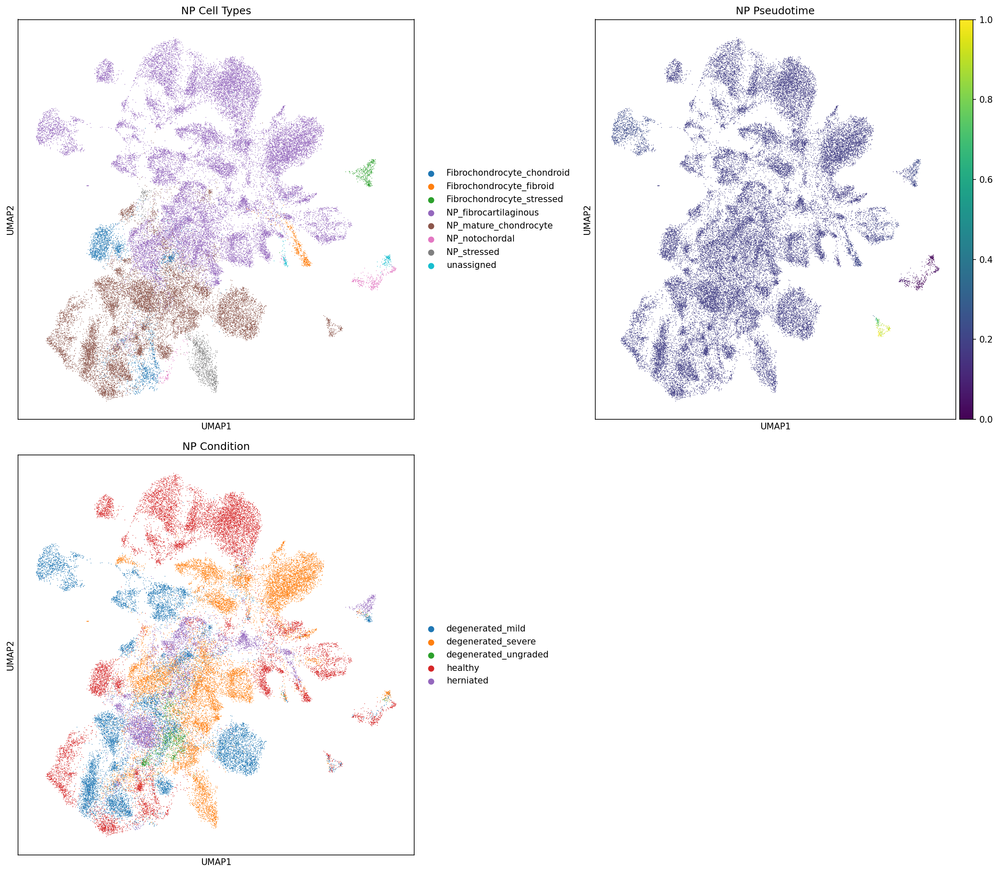

### AF — UMAP Trajectory

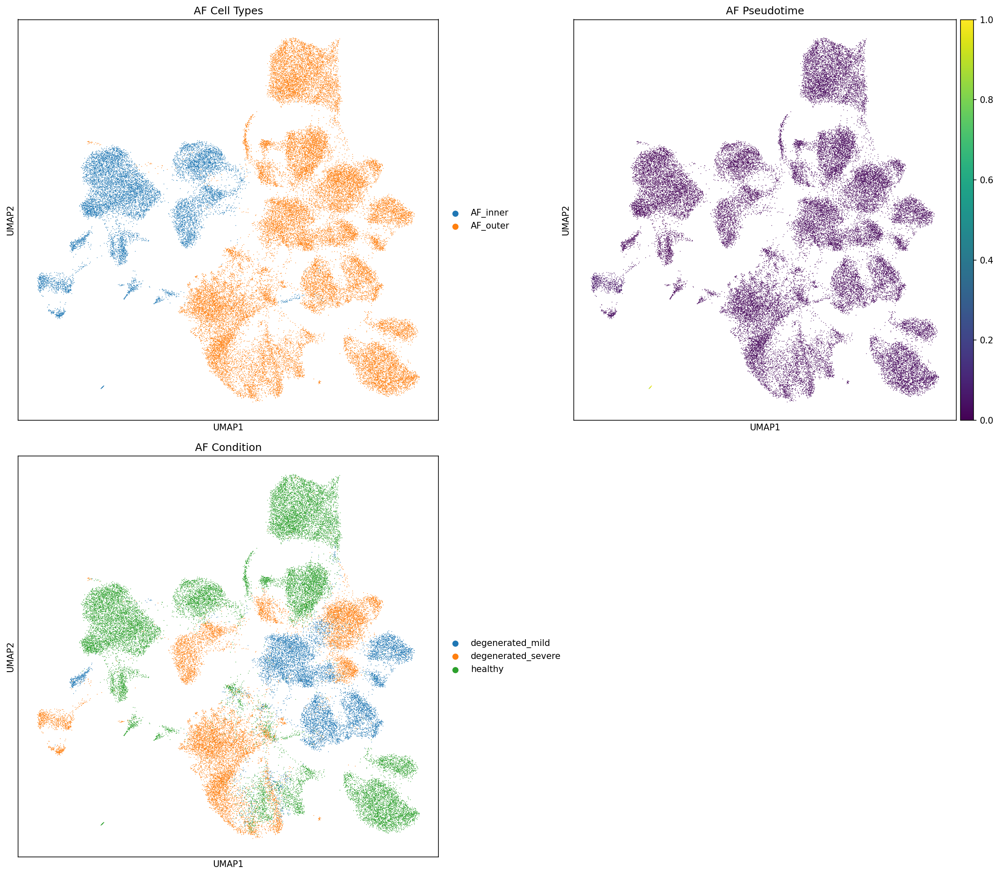

### CEP — UMAP Trajectory

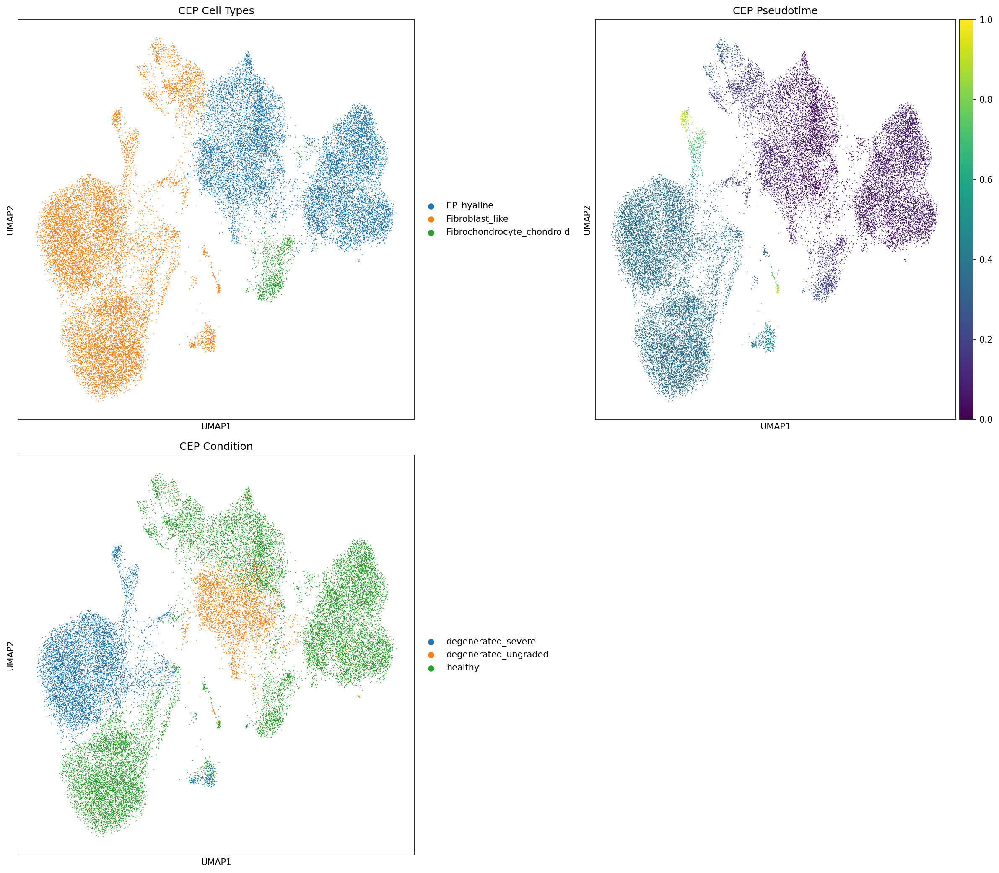

In [9]:
# UMAP trajectory plots
for comp in ['NP', 'AF', 'CEP']:
    umap_traj_path = RESULTS / f'umap_trajectory_{comp}.png'
    if umap_traj_path.exists():
        display(Markdown(f'### {comp} — UMAP Trajectory'))
        display(Image(filename=str(umap_traj_path), width=700))

## Status — Module 10 Complete (v4)

### Summary
- PAGA + DPT trajectories computed for NP, AF, and CEP compartments
- Pseudotime-condition correlations reveal compartment-specific patterns
- Gene dynamics show key marker transitions along trajectories
- Trajectory-DE overlap validates convergent findings across methods

### Discussion point: AF trajectory
The AF pseudotime-condition correlation may differ in sign from NP/CEP,
suggesting compartment-specific degeneration programs. Possible interpretations:
1. AF cells undergo a different degeneration program (fibrotic maturation rather
   than dedifferentiation)
2. AF trajectory captures a stress-induced differentiation response
3. Technical: AF trajectory direction may need reassessment of root cell choice

### Next steps
- Module 11: Cell-cell communication analysis (LIANA)